<a href="https://colab.research.google.com/github/y-oth/dst_assessment2/blob/main/Copy_of_Comparison_jemma.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

!git clone https://github.com/y-oth/dst_assessment2
%cd dst_assessment2




fatal: destination path 'dst_assessment2' already exists and is not an empty directory.
/content/dst_assessment2


In [ ]:
!ls
!ls dst_assessment2


 CNN_LRP_project_DST.ipynb  'Elliot M'	 report		   'Youssef O'
 Comparison.ipynb	    'Jemma H'	 Requirements.txt
 data			     Kyra	 R_requirements.R
 dst_assessment2	     README.md	 Tomi
 CNN_LRP_project_DST.ipynb  'Elliot M'	 README.md	    R_requirements.R
 Comparison.ipynb	    'Jemma H'	 report		    Tomi
 data			     Kyra	 Requirements.txt  'Youssef O'


In [ ]:
!pwd
!ls


/content/dst_assessment2
 CNN_LRP_project_DST.ipynb  'Elliot M'	 report		   'Youssef O'
 Comparison.ipynb	    'Jemma H'	 Requirements.txt
 data			     Kyra	 R_requirements.R
 dst_assessment2	     README.md	 Tomi


In [ ]:
!git clone https://github.com/y-oth/dst_assessment2
%cd dst_assessment2


fatal: destination path 'dst_assessment2' already exists and is not an empty directory.
/content/dst_assessment2/dst_assessment2


In [ ]:
!find dst_assessment2 -maxdepth 3 -type d


find: ‘dst_assessment2’: No such file or directory


In [ ]:
!pwd
!ls -R


/content/dst_assessment2/dst_assessment2
.:
 CNN_LRP_project_DST.ipynb  'Elliot M'	 README.md	    R_requirements.R
 Comparison.ipynb	    'Jemma H'	 report		    Tomi
 data			     Kyra	 Requirements.txt  'Youssef O'

./data:
Testing  Training

./data/Testing:
glioma_tumor  meningioma_tumor	no_tumor  pituitary_tumor

./data/Testing/glioma_tumor:
'image(100).jpg'		  'image(55).jpg'
'image(100).jpg:Zone.Identifier'  'image(55).jpg:Zone.Identifier'
'image(10).jpg'			  'image(56).jpg'
'image(10).jpg:Zone.Identifier'   'image(56).jpg:Zone.Identifier'
'image(11).jpg'			  'image(57).jpg'
'image(11).jpg:Zone.Identifier'   'image(57).jpg:Zone.Identifier'
'image(12).jpg'			  'image(58).jpg'
'image(12).jpg:Zone.Identifier'   'image(58).jpg:Zone.Identifier'
'image(13).jpg'			  'image(59).jpg'
'image(13).jpg:Zone.Identifier'   'image(59).jpg:Zone.Identifier'
'image(14).jpg'			  'image(5).jpg'
'image(14).jpg:Zone.Identifier'   'image(5).jpg:Zone.Identifier'
'image(15).jpg'			  'image(60).jpg'
'image(15

In [ ]:
import os, glob
glob.glob("**/*.pth", recursive=True)


['Tomi/final_model.pth', 'report/final_model.pth']

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F

import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

In [ ]:
# Setting to GPU if available
device = torch.device("cuda" if torch.cuda.is_available else "cpu")
print(f"Using: {device}")

Using: cuda


In [ ]:
class FlexibleCNN(nn.Module):
    def __init__(self, n_layers, n_filters, kernel_sizes, dropout, fc_size):
        super().__init__()

        blocks = []

        in_channels = 3

        for i in range(n_layers):
            out_channels = n_filters[i]
            kernel_size = kernel_sizes[i]

            padding = (kernel_size - 1) // 2

            # Individual CNN block
            block = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size, padding=padding),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2)
            )

            blocks.append(block)

            in_channels = out_channels

        # Combine all blocks
        self.features = nn.Sequential(*blocks)

        self.dropout = dropout
        self.fc_size = fc_size

        self.classifier = None

    def _create_classifier(self, flattened_size, device):
        self.classifier = nn.Sequential(
            nn.Dropout(self.dropout),
            nn.Linear(flattened_size, self.fc_size),
            nn.ReLU(inplace=True),
            nn.Dropout(self.dropout),
            nn.Linear(self.fc_size, 4)
        ).to(device)

    def forward(self, x):
        device = x.device

        x = self.features(x)

        flattened = torch.flatten(x, 1)
        flattened_size = flattened.size(1)

        if self.classifier is None:
            self._create_classifier(flattened_size, device)

        return self.classifier(flattened)

In [ ]:
best_params = {
    "n_layers": 4,
    "n_filters_0": 256,
    "n_filters_1": 80,
    "n_filters_2": 48,
    "n_filters_3": 240,
    "kernel_size_0": 3,
    "kernel_size_1": 5,
    "kernel_size_2": 3,
    "kernel_size_3": 5,
    "dropout": 0.1265531928742637,
    "fc_size": 400,
    "lr": 0.0008484833582874335
}

n_layers = best_params["n_layers"]
n_filters = [best_params[f"n_filters_{i}"] for i in range(n_layers)]
kernel_sizes = [best_params[f"kernel_size_{i}"] for i in range(n_layers)]
dropout = best_params["dropout"]
fc_size = best_params["fc_size"]

learning_rate = best_params["lr"] # probably don't need this one

# Instantiating the CNN with specified hyper parameters
model = FlexibleCNN(n_layers, n_filters, kernel_sizes, dropout, fc_size).to(device)

# Dummy input to create the classifier layer
dummy_input = torch.randn(1, 3, 224, 224).to(device)
model(dummy_input)

# Loading the model with saved weights
model.load_state_dict(torch.load("report/final_model.pth"))
model.eval()

FlexibleCNN(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1): Sequential(
      (0): Conv2d(256, 80, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (2): Sequential(
      (0): Conv2d(80, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (3): Sequential(
      (0): Conv2d(48, 240, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (classifier): Sequential(
    (0): Dropout(p=0.1265531928742637, inplace=False)
    (1): Linear(in_features=47040, out_fe

In [ ]:
# Preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_dataset = datasets.ImageFolder("./data/Training", transform=transform)
test_dataset = datasets.ImageFolder("./data/Testing",  transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)
#test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True, num_workers=0)




/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


## LRP code


In [ ]:
import torch
import torch.nn as nn

# ------------------------------------------------------------
# Helper: recreate each layer with modified weights (rho-rule)
# ------------------------------------------------------------
def new_layer(layer, rho):
    """
    Create a copy of the layer with modified weights based on rho().
    """
    if isinstance(layer, nn.Conv2d):
        new = nn.Conv2d(
            layer.in_channels,
            layer.out_channels,
            kernel_size=layer.kernel_size,
            stride=layer.stride,
            padding=layer.padding,
            bias=(layer.bias is not None),
        )
        new.weight = nn.Parameter(rho(layer.weight))
        if layer.bias is not None:
            new.bias = nn.Parameter(rho(layer.bias))
        return new

    elif isinstance(layer, nn.Linear):
        new = nn.Linear(
            layer.in_features,
            layer.out_features,
            bias=(layer.bias is not None),
        )
        new.weight = nn.Parameter(rho(layer.weight))
        if layer.bias is not None:
            new.bias = nn.Parameter(rho(layer.bias))
        return new

    elif isinstance(layer, nn.AvgPool2d):
        # pooling has no weights → just reuse it
        return layer

    else:
        # For other layers we don't change weights
        return layer


# ------------------------------------------------------------
# Main LRP function for FlexibleCNN
# ------------------------------------------------------------
def apply_lrp_flexiblecnn(model, image):
    """
    LRP for a FlexibleCNN architecture with arbitrary CNN depth.
    Uses:
       - gamma-rule for early conv layers
       - epsilon-rule for deep conv & hidden FC layers
       - 0-rule for final FC layer
    """
    device = image.device
    model.eval()

    # -----------------------
    # 1. Extract ALL layers
    # -----------------------
    def get_all_layers_flexiblecnn(model):
        layers = []

        # Extract conv blocks from model.features (Sequential of blocks)
        for block in model.features:
            for layer in block:
                layers.append(layer)

        # Insert Flatten BEFORE classifier
        layers.append(nn.Flatten())

        # Extract fully connected layers from model.classifier (Sequential)
        if model.classifier is None:
            raise ValueError("model.classifier is None – run a forward pass once so it gets created.")
        for layer in model.classifier:
            layers.append(layer)

        return layers

    original_layers = get_all_layers_flexiblecnn(model)

    # -----------------------------------------
    # Build LRP layer list (MaxPool → AvgPool)
    # -----------------------------------------
    lrp_layers = []
    for layer in original_layers:
        if isinstance(layer, nn.MaxPool2d):
            lrp_layers.append(
                nn.AvgPool2d(
                    kernel_size=layer.kernel_size,
                    stride=layer.stride,
                    padding=layer.padding,
                )
            )
        else:
            lrp_layers.append(layer)

    # -----------------------------------------
    # 2. Forward pass: store all activations
    # -----------------------------------------
    x = image.unsqueeze(0)          # (1, C, H, W)
    activations = [x]

    for layer in lrp_layers:
        x = layer(x)
        activations.append(x)

    # -----------------------------------------
    # 3. Create one-hot output relevance
    # -----------------------------------------
    output = activations[-1].detach()    # (1, num_classes)
    max_idx = torch.argmax(output)

    one_hot = torch.zeros_like(output)
    one_hot[0, max_idx] = output[0, max_idx]   # keep magnitude

    relevances = [None] * len(activations)
    relevances[-1] = one_hot

    # -----------------------------------------
    # Determine conv layers & gamma assignment
    # -----------------------------------------
    conv_indices = [i for i, layer in enumerate(lrp_layers) if isinstance(layer, nn.Conv2d)]
    conv_count = len(conv_indices)
    if conv_count > 0:
        gamma_cutoff = max(1, int(0.3 * conv_count))  # first ~30% conv layers use gamma
    else:
        gamma_cutoff = 0

    # final linear index
    linear_indices = [i for i, layer in enumerate(lrp_layers) if isinstance(layer, nn.Linear)]
    if not linear_indices:
        raise ValueError("No Linear layers found in model.classifier – unexpected for FlexibleCNN.")
    last_linear = linear_indices[-1]

    # -----------------------------------------
    # 4. Backward relevance propagation
    # -----------------------------------------
    for i in reversed(range(len(lrp_layers))):

        layer = lrp_layers[i]

        # -------------- Handle Flatten ----------------
        if isinstance(layer, nn.Flatten):
            prev_shape = activations[i].shape
            relevances[i] = relevances[i+1].reshape(prev_shape)
            continue

        # Skip ReLU (pass relevance unchanged)
        if isinstance(layer, nn.ReLU):
            relevances[i] = relevances[i+1]
            continue

        # Skip Dropout (pass relevance unchanged)
        if isinstance(layer, nn.Dropout):
            relevances[i] = relevances[i+1]
            continue

        # Input activation for this layer
        a = activations[i].detach().clone().requires_grad_(True).to(device)
        r = relevances[i+1].to(device)

        # -------------- Select LRP Rule ----------------
        if isinstance(layer, nn.Conv2d):

            conv_idx = conv_indices.index(i)

            if conv_idx < gamma_cutoff:
                # --------- Early convolution (gamma-rule) -------
                rho = lambda p: p + 0.25 * torch.clamp(p, min=0)
                incr = lambda z: z + 1e-9
            else:
                # --------- Deep convolution (epsilon-rule) -------
                rho = lambda p: p
                incr = lambda z: z + 1e-6

        elif isinstance(layer, nn.Linear):

            if i == last_linear:
                # --------- Output layer (LRP-0) -------
                rho = lambda p: p
                incr = lambda z: z + 1e-9
            else:
                # --------- Hidden FC (epsilon-rule) -------
                rho = lambda p: p
                incr = lambda z: z + 1e-6

        elif isinstance(layer, nn.AvgPool2d):
            # treat like linear mapping → epsilon-rule
            rho = lambda p: p
            incr = lambda z: z + 1e-6

        else:
            # Unknown / non-parametric layer type → pass relevance unchanged
            relevances[i] = relevances[i+1]
            continue

        # -------------- LRP Computation ----------------
        z_layer = new_layer(layer, rho).to(device)
        z = z_layer(a)
        z = incr(z)

        s = (r / z).detach()
        (z * s).sum().backward()
        c = a.grad

        relevance = a * c
        relevances[i] = relevance

    # Relevance for the input (same shape as image with batch dim)
    return relevances[0]


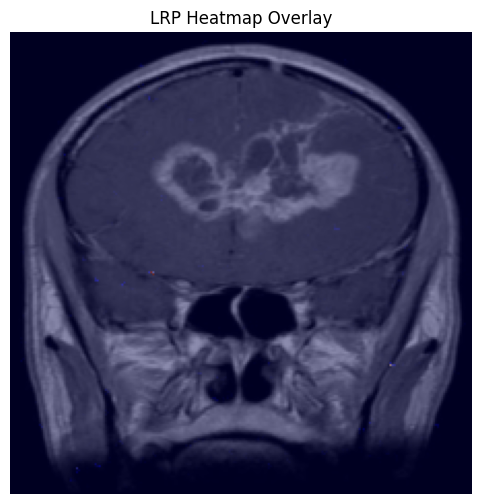

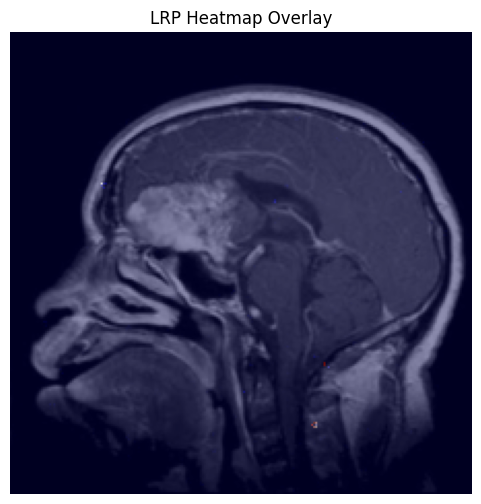

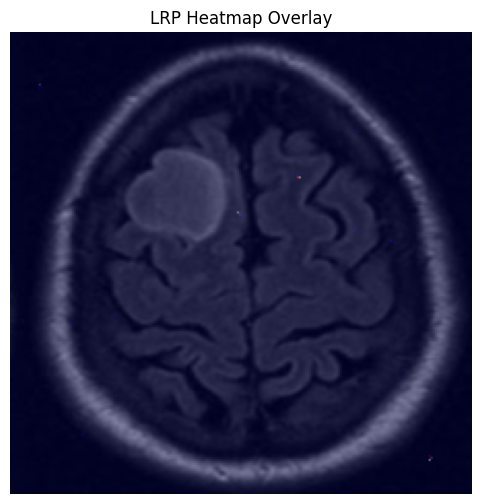

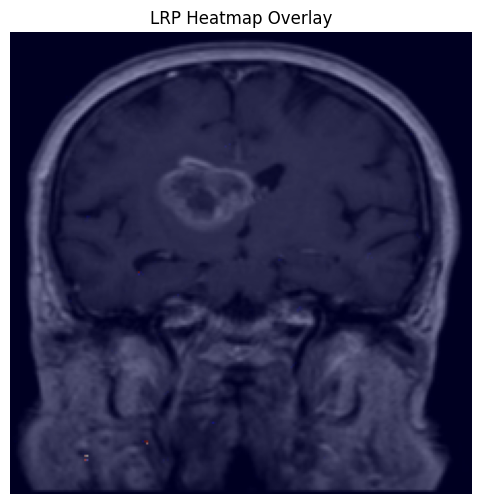

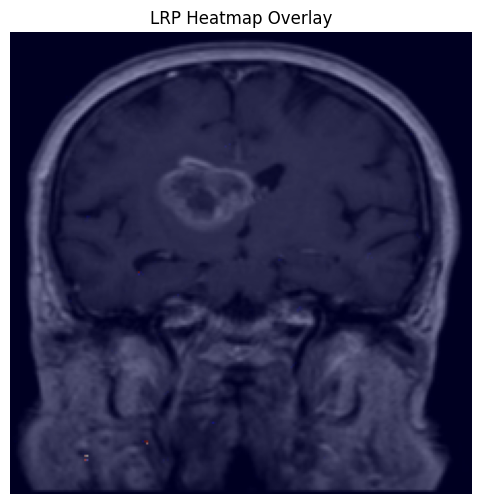

...

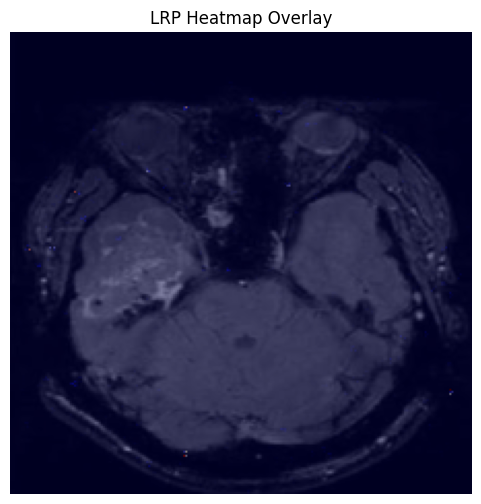

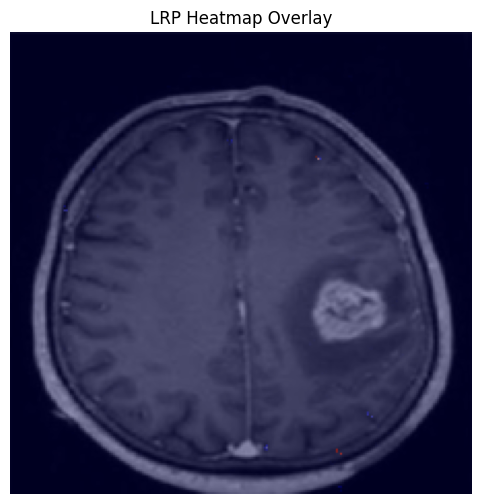

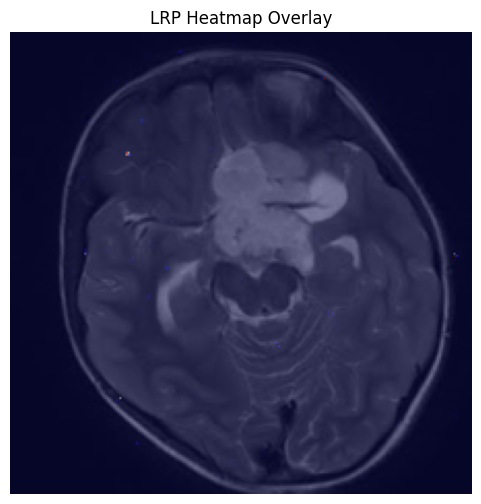

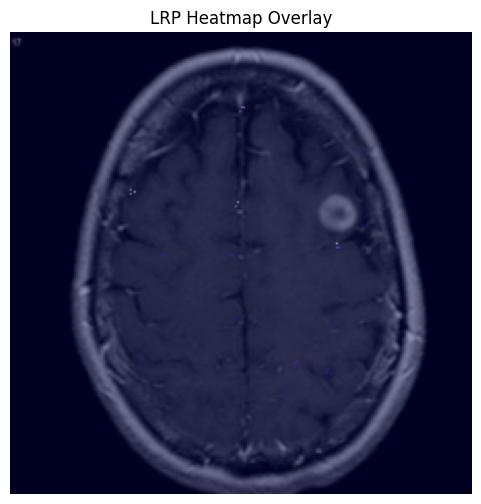

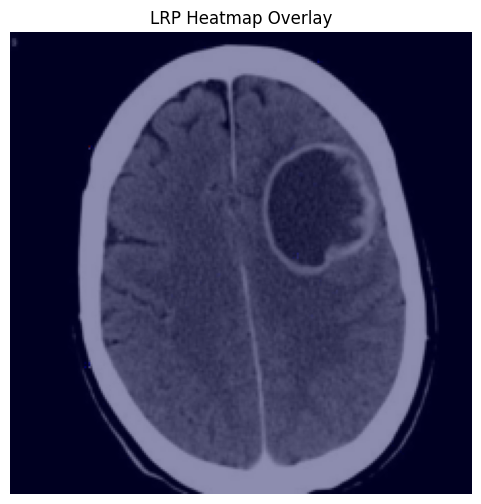

In [ ]:
# Implementing LRP to simple CNN
# %%
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
import torch

def unnormalize(img):
    """
    Undo normalization for visualization.
    Assumes ImageNet mean/std unless you specify otherwise.
    """
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return img * std + mean

N = 32
inputs, labels = next(iter(test_loader))
inputs = inputs.to(device)
labels = labels.to(device)

model.eval()
# Build index → class name mapping
idx_to_class = {v: k for k, v in test_dataset.class_to_idx.items()}


for i in range(N):
    img = inputs[i].to(device)
    # Compute LRP
    R_tensor = apply_lrp_flexiblecnn(model, img)

    # Convert to NumPy
    R = R_tensor.detach().cpu().numpy()[0]   # (3,H,W)
    R = R.sum(axis=0)                        # (H,W)
    R = np.maximum(R, 0)
    R = (R - R.min()) / (R.max() - R.min() + 1e-9)

    # Prepare original image
    img_display = unnormalize(img.cpu()).permute(1,2,0).numpy()
    img_display = np.clip(img_display, 0, 1)

    # Plot overlay
    plt.figure(figsize=(6,6))
    plt.imshow(img_display)
    plt.imshow(R, cmap='seismic', alpha=0.45)   # Heatmap overlay
    plt.axis("off")
    plt.title("LRP Heatmap Overlay")
    plt.show()











## New LRP code


In [ ]:
!pip install captum

In [ ]:
import torch
from captum.attr import LRP
import matplotlib.pyplot as plt


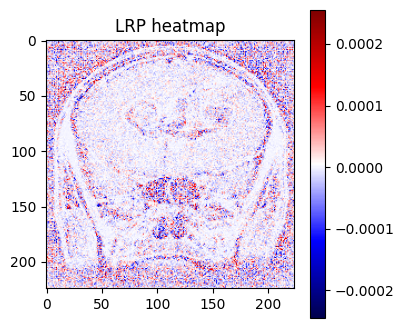

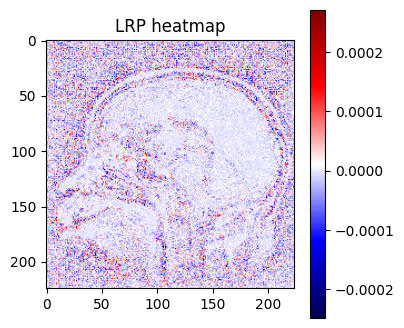

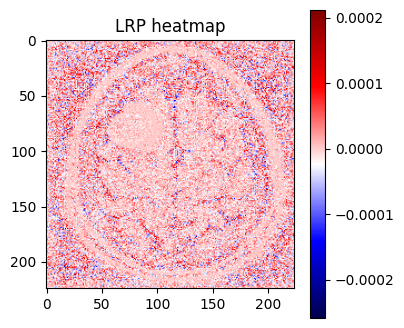

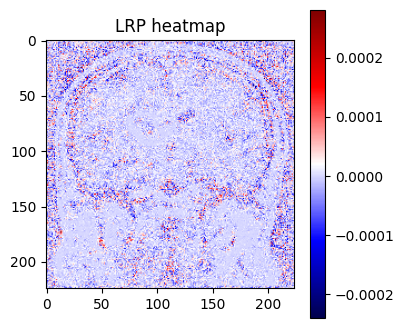

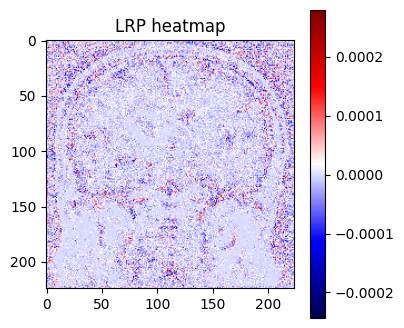

...

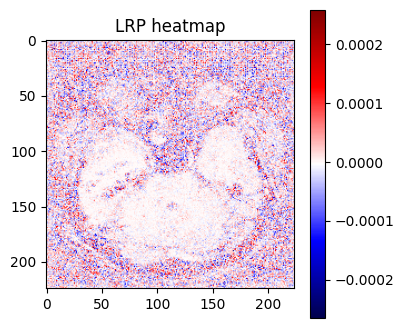

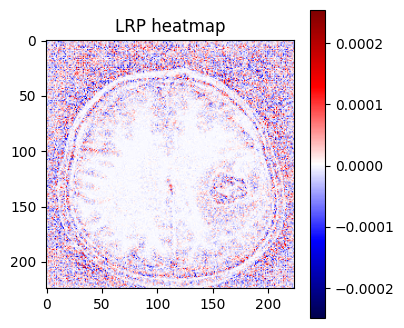

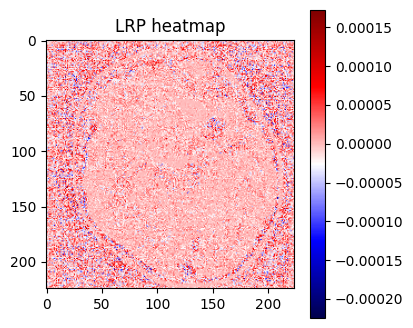

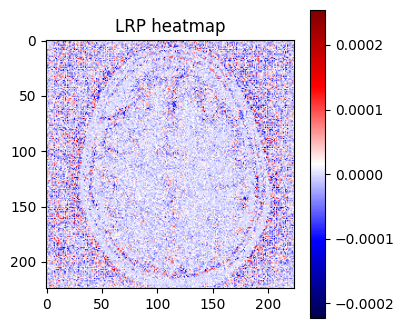

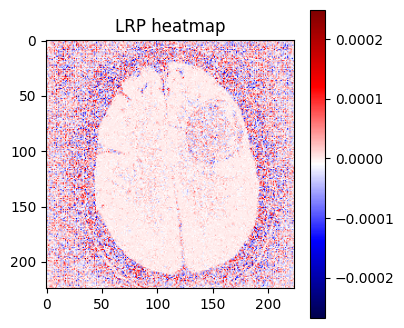

In [ ]:
import torch
from captum.attr import LRP
import matplotlib.pyplot as plt
from captum.attr import LRP


model = FlexibleCNN(n_layers, n_filters, kernel_sizes, dropout, fc_size).to(device)
N= 32
inputs, labels = next(iter(test_loader))
inputs = inputs.to(device)
labels = labels.to(device)
model.eval()
for i in range(N):
    img = inputs[i].unsqueeze(0)
    img = img.to(device)
# pick an image from your dataset
# img = inputs[0].unsqueeze(0)       # shape [1, 3, H, W]
# img = img.to(device)

# predicted class
    with torch.no_grad():
        output = model(img)
    pred_class = output.argmax(dim=1).item()

# ---- Captum LRP ----
    lrp = LRP(model)
    R = lrp.attribute(img, target=pred_class)

    # Convert relevance to numpy
    R = R.squeeze().detach().cpu().numpy()

    # Plot heatmap
    plt.figure(figsize=(4,4))
    plt.imshow(R[0], cmap='seismic')  # channel 0 or summed across channels
    plt.colorbar()
    plt.title("LRP heatmap")
    plt.show()


In [ ]:
def apply_lrp_flexiblecnn(model, img, target_class=None):
    model.eval()

    # Ensure batch dimension
    img_batch = img.unsqueeze(0)

    # Forward pass to get predicted class if none supplied
    with torch.no_grad():
        output = model(img_batch)
        pred = output.argmax(dim=1).item()

    if target_class is None:
        target_class = pred

    # ---- Apply LRP ----
    lrp = LRP(model)
    R = lrp.attribute(img_batch, target=target_class)

    # Convert to numpy
    R = R.squeeze().detach().cpu().numpy()

    # Sum across channels for heatmap
    heatmap = np.sum(R, axis=0)

    # Normalize for visual clarity
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-10)

    return heatmap, pred


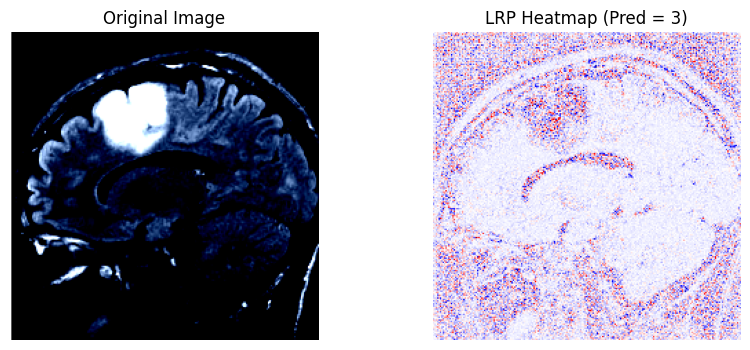

In [ ]:

model.to(device)

img, label = test_dataset[8]   # or test_dataset
img = img.to(device)

heatmap, pred = apply_lrp_flexiblecnn(model, img)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(img.permute(1,2,0).cpu())
plt.axis("off")

plt.subplot(1,2,2)
plt.title(f"LRP Heatmap (Pred = {pred})")
plt.imshow(heatmap, cmap="seismic")
plt.axis("off")
plt.show()
